In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import math
import seaborn as sns
from collections import Counter
from scipy import sparse
from scipy.sparse import csr_matrix
%matplotlib inline
from sklearn.linear_model import LogisticRegression
from sklearn.svm import LinearSVC, SVC
from sklearn.ensemble import RandomForestClassifier, HistGradientBoostingClassifier
from sklearn.tree import DecisionTreeClassifier, export_graphviz, plot_tree
from xgboost import XGBClassifier
from sklearn.calibration import CalibratedClassifierCV, calibration_curve
from sklearn.model_selection import train_test_split, GridSearchCV, ParameterGrid
from sklearn.preprocessing import StandardScaler, OneHotEncoder, OrdinalEncoder, LabelEncoder
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error, accuracy_score, f1_score, confusion_matrix, classification_report, make_scorer, brier_score_loss
from sklearn import svm
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer, make_column_transformer
from sklearn.pipeline import make_pipeline

import warnings
warnings.filterwarnings("ignore")

path = "../Data/"

In [2]:
song_dataset = pd.read_csv(path + 'features_spotify.csv')
song_dataset.head()

,song_name,artist_name,song_id,analysis_sample_rate,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,bpm,duration,time_signature,genre
0,Cross Road Blues,Robert Johnson,1TrGdXSgiBm8W68D2K1COG,22050,0.675,0.3110,9,-11.959,1,0.0525,0.930,0.000261,0.1020,0.638,97.159,149.560,4,Blues
1,I Can't Quit You Baby,Willie Dixon,2PcbVKT28p9mOlWBDL371J,22050,0.469,0.2360,7,-16.981,1,0.0364,0.407,0.043400,0.2150,0.415,82.232,399.173,4,Blues
2,Red House,Jimi Hendrix,3XxBSvDZKH5YvZZjTpn6eR,22050,0.277,0.4790,5,-8.483,0,0.0495,0.585,0.022400,0.1600,0.483,53.905,230.360,4,Blues
3,Sweet Home Chicago,Robert Johnson,2wPHe2ecCdkT0ly0km12g4,22050,0.691,0.0958,1,-13.900,0,0.1430,0.980,0.000016,0.0931,0.519,101.574,176.627,4,Blues
4,I'm Your Hoochie Coochie Man,Muddy Waters,3KSchPNSklO5McIqRH3qYX,22050,0.542,0.5880,2,-9.268,1,0.0665,0.670,0.158000,0.2410,0.881,113.948,238.533,3,Blues


## Preprocessing

In [3]:
# We can drop columns song_name and song_id because they have nothing to do with whether a song is a specfic genre
# We can drop analysis_sample_rate because its the same for every song
# Although an artist can be a good indicator and thus predictor of a songs genre, it could lead to overfitting so we decided to drop it

song_dataset_df = song_dataset.drop(columns=['song_name', 'artist_name', 'song_id', 'analysis_sample_rate'])
song_dataset_df.columns

Index(['danceability', 'energy', 'key', 'loudness', 'mode', 'speechiness',
       'acousticness', 'instrumentalness', 'liveness', 'valence', 'bpm',
       'duration', 'time_signature', 'genre'],
      dtype='object')

In [4]:
def checktoDropValues(c1_matrix): 
    lista = []
    for i in range(len(c1_matrix.columns)): 
        for j in range(i):
            x = c1_matrix.index[i], "-", c1_matrix.columns[j], ": ", c1_matrix.iloc[i, j]
            lista.append(x)
    lista.sort(key=lambda x: x[4], reverse=True) 
    storevar = []
    to_drop = []
    listFeature1 = []
    listFeature2 = []
    for i in range(len(lista)):
        if lista[i][4] > .9 or lista[i][4] < -.9: 
            to_drop.append(lista[i][4])
            x = lista[i][0]
            y = lista[i][2]
            z = str(f"{x} - {y}") 
            storevar.append(z) 
            listFeature1.append(x) 
            listFeature2.append(y)
    zipped_list = list(zip(listFeature1, listFeature2)) 
    if (len(to_drop) == 0):
        print("No values needed to be dropped")
        return
    else:
        print(f"Values need to be dropped from correlation matrix are : {to_drop} from {storevar}") 
        return zipped_list
    
def getColsToRemove(removeList):
    FL = Counter(value for _, value in removeList)
    # frequency = FL.most_common()
    most_common = sorted(FL.items(), key=lambda x: x[1], reverse=True)
    dropping = []
    for value, count in most_common:
        dropping.append(value)
    return dropping

In [5]:
genre_map = {'Blues': 0, 'Classical': 1, 'Country': 2, 'Disco': 3, 'HipHop': 4, 'Jazz': 5, 'Metal': 6, 'Pop': 7, 'Reggae': 8,'Rock': 9}
song_dataset_df['genre'] = song_dataset_df['genre'].map(genre_map)

song_dataset_X = song_dataset_df.drop(columns=['genre'])
song_dataset_y = song_dataset_df['genre']

In [6]:
song_dataset_df['mode'] = song_dataset_df['mode'].replace({0: 'Minor', 1: 'Major'})
song_dataset_df['key'] = song_dataset_df['key'].replace({0:'C', 1:'D-flat', 2:'D', 3:'E-flat', 4:'E', 5:'F', 6:'F-sharp', 7:'G', 8:'A-flat', 9:'A', 10:'B-flat', 11:'B'})
song_dataset_df['time_signature'] = song_dataset_df['time_signature'].replace({1: '1/4', 2: '2/4', 3: '3/4', 4: '4/4', 5: '5/4'})

num_song_features = song_dataset_X.drop(columns=['key', 'mode', 'time_signature'])
cat_song_features = song_dataset_X.drop(num_song_features.columns, axis=1)

ohe = OneHotEncoder()
cat_song_features_transformed = ohe.fit_transform(cat_song_features)

cat_song_features_transformed_df = pd.DataFrame(cat_song_features_transformed.toarray(), columns=ohe.get_feature_names_out(cat_song_features.columns))
song_dataset_X_transformed = pd.concat([num_song_features, cat_song_features_transformed_df], axis=1)


corr_matrix = song_dataset_X_transformed.corr()
checker = checktoDropValues(corr_matrix)

Values need to be dropped from correlation matrix are : [-0.9292669788085285, -0.9999999999999999] from ['time_signature_4 - time_signature_3', 'mode_1 - mode_0']


In [7]:
removingList = getColsToRemove(checker)

song_dataset_transformed_new = song_dataset_X_transformed.drop(columns=removingList)
corr_matrix_new = song_dataset_transformed_new.corr()
checker1 = checktoDropValues(corr_matrix_new)

No values needed to be dropped


In [8]:
genre_target_label = song_dataset_y.to_numpy().reshape(-1,1)
song_dataset_X_dev, song_dataset_X_test, song_dataset_y_dev, song_dataset_y_test = train_test_split(song_dataset_transformed_new.to_numpy(), genre_target_label, test_size=0.2, random_state=42)
song_dataset_X_train, song_dataset_X_val, song_dataset_y_train, song_dataset_y_val = train_test_split(song_dataset_X_dev, song_dataset_y_dev, test_size=0.25, random_state=42)

scaler = StandardScaler()
song_dataset_X_train_scaled = scaler.fit_transform(song_dataset_X_train)
song_dataset_X_val_scaled = scaler.transform(song_dataset_X_val)          
song_dataset_X_test_scaled = scaler.transform(song_dataset_X_test)    

In [9]:
print("Shape of Scaled X_train:", song_dataset_X_train_scaled.shape)
print("Shape of Scaled X_train:", song_dataset_X_val_scaled.shape)
print("Shape of Scaled X_train:", song_dataset_X_test_scaled.shape)

Shape of Scaled X_train: (300, 26)
Shape of Scaled X_train: (100, 26)
Shape of Scaled X_train: (100, 26)


## ML Models

### Logistic Regression

In [10]:
logreg = LogisticRegression(multi_class='multinomial', solver='lbfgs', max_iter=1000)
param_grid = {
    'logreg__C': np.logspace(-3, 2, 100),
    'logreg__penalty': ['l1', 'l2', 'elasticnet']
}
pipe = Pipeline([('logreg', logreg)])

grid_search = GridSearchCV(pipe, param_grid, scoring='accuracy', cv=5, n_jobs=-1)
grid_search.fit(song_dataset_X_train_scaled, song_dataset_y_train.ravel())
print("Best hyperparameters:", grid_search.best_params_)
print("Training accuracy:", grid_search.best_score_)

best_model = grid_search.best_estimator_
y_pred_val = best_model.predict(song_dataset_X_val_scaled) 
accuracy = accuracy_score(song_dataset_y_val, y_pred_val)
print("Validation accuracy: {:.3f}".format(accuracy))

Best hyperparameters: {'logreg__C': 4.328761281083057, 'logreg__penalty': 'l2'}
Training accuracy: 0.54
Validation accuracy: 0.560


In [11]:
logreg1 = LogisticRegression(multi_class='multinomial', solver='lbfgs', max_iter=1000, C=4.328761281083057, penalty='l2')
logreg1.fit(np.concatenate([song_dataset_X_train_scaled, song_dataset_X_val_scaled]), np.concatenate([song_dataset_y_train, song_dataset_y_val]))
y_pred = logreg1.predict(song_dataset_X_test_scaled)

accuracy = accuracy_score(song_dataset_y_test, y_pred)
print("Test accuracy: {:.3f}".format(accuracy))

Test accuracy: 0.590


In [12]:
print("Best Prediction Table")
logregCM = confusion_matrix(song_dataset_y_test, y_pred)
cm_df_log = pd.DataFrame(logregCM, columns=['Predicted Blues', 'Predicted Classical', 'Predicted Country', 'Predicted Disco', 'Predicted HipHop', 'Predicted Jazz', 'Predicted Metal', 'Predicted Pop', 'Predicted Reggae', 'Predicted Rock'], index=['Actual Blues', 'Actual Classical', 'Actual Country', 'Actual Disco', 'Actual HipHop', 'Actual Jazz', 'Actual Metal', 'Actual Pop', 'Actual Reggae', 'Actual Rock'])
cm_df_log

Best Prediction Table


,Predicted Blues,Predicted Classical,Predicted Country,Predicted Disco,Predicted HipHop,Predicted Jazz,Predicted Metal,Predicted Pop,Predicted Reggae,Predicted Rock
Actual Blues,5,0,0,1,0,4,0,0,1,0
Actual Classical,0,16,0,0,0,1,0,0,0,0
Actual Country,0,0,4,0,0,0,1,0,0,0
Actual Disco,1,0,0,7,0,0,0,0,1,0
Actual HipHop,0,0,1,1,1,0,0,0,1,0
Actual Jazz,0,2,0,0,1,2,0,0,0,1
Actual Metal,0,0,1,0,0,0,9,1,0,1
Actual Pop,0,0,3,0,0,0,0,7,2,0
Actual Reggae,1,0,0,1,1,0,0,2,4,0
Actual Rock,0,0,5,0,0,1,4,1,0,4


### Support Vector Machines

In [13]:
pipe = Pipeline([('svm', SVC())])

parameters = {'svm__C': [0.01, 0.1, 1, 10, 100],
              'svm__kernel': ['linear', 'poly', 'rbf', 'sigmoid']}

grid_search = GridSearchCV(pipe, parameters, scoring='accuracy', cv=5, n_jobs=-1)

grid_search.fit(song_dataset_X_train, song_dataset_y_train.ravel())
print("Best hyperparameters:", grid_search.best_params_)
best_model = grid_search.best_estimator_
print("Training accuracy:", best_model.score(song_dataset_X_train, song_dataset_y_train))
print("Validation accuracy:", best_model.score(song_dataset_X_val, song_dataset_y_val))

Best hyperparameters: {'svm__C': 1, 'svm__kernel': 'linear'}
Training accuracy: 0.69
Validation accuracy: 0.55


In [14]:
svm1 = SVC(kernel='linear', C=1)
svm1.fit(np.concatenate([song_dataset_X_train,song_dataset_X_val]), np.concatenate([song_dataset_y_train, song_dataset_y_val]))
print(f'Test Score: {svm1.score(song_dataset_X_test, song_dataset_y_test)}')

Test Score: 0.5


In [15]:
y_pred = svm1.predict(song_dataset_X_test)
cmTestPrimal = confusion_matrix(song_dataset_y_test, y_pred)
cm_df_TestPrimal = pd.DataFrame(cmTestPrimal, columns=['Predicted Blues', 'Predicted Classical', 'Predicted Country', 'Predicted Disco', 'Predicted HipHop', 'Predicted Jazz', 'Predicted Metal', 'Predicted Pop', 'Predicted Reggae', 'Predicted Rock'], index=['Actual Blues', 'Actual Classical', 'Actual Country', 'Actual Disco', 'Actual HipHop', 'Actual Jazz', 'Actual Metal', 'Actual Pop', 'Actual Reggae', 'Actual Rock'])
cm_df_TestPrimal

,Predicted Blues,Predicted Classical,Predicted Country,Predicted Disco,Predicted HipHop,Predicted Jazz,Predicted Metal,Predicted Pop,Predicted Reggae,Predicted Rock
Actual Blues,4,0,0,0,1,4,0,0,2,0
Actual Classical,0,15,0,0,0,2,0,0,0,0
Actual Country,0,0,5,0,0,0,0,0,0,0
Actual Disco,1,0,0,6,0,0,0,1,1,0
Actual HipHop,0,0,1,1,2,0,0,0,0,0
Actual Jazz,0,2,0,0,1,2,0,0,0,1
Actual Metal,0,0,5,0,0,0,6,0,0,1
Actual Pop,0,0,5,0,2,1,0,3,1,0
Actual Reggae,1,0,0,2,0,0,0,1,4,1
Actual Rock,0,0,4,0,0,2,6,0,0,3


### Decision Trees

In [16]:
song_dataset_X_dev_tree, song_dataset_X_test_tree, song_dataset_y_dev_tree, song_dataset_y_test_tree = train_test_split(song_dataset_transformed_new, song_dataset_y, test_size=0.2, random_state=42)
song_dataset_X_train_tree, song_dataset_X_val_tree, song_dataset_y_train_tree, song_dataset_y_val_tree = train_test_split(song_dataset_X_dev_tree, song_dataset_y_dev_tree, test_size=0.25, random_state=42)

decision_tree = DecisionTreeClassifier(random_state=42)
decision_tree.fit(song_dataset_X_dev_tree, song_dataset_y_dev_tree)
plt.figure(figsize=(60,20), dpi = 600)
plot_tree(decision_tree, filled=True, feature_names=song_dataset_X_dev_tree.columns, class_names=['0', '1', '2', '3', '4', '5', '6', '7', '8', '9'], max_depth=8)
plt.show()

param_grid = {
    'max_depth': [2, 4, 6, 8, 10],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
    'ccp_alpha': [0, 0.001, 0.01, 0.1, 1]
}

grid_search = GridSearchCV(decision_tree, param_grid=param_grid, cv=5)
grid_search.fit(song_dataset_X_train_tree, song_dataset_y_train_tree)
print('Best hyperparameters:', grid_search.best_params_)
best_model = grid_search.best_estimator_

print('Best cross-validation score:', grid_search.best_score_)
print("Training accuracy:", best_model.score(song_dataset_X_train_tree, song_dataset_y_train_tree))
print("Validation accuracy:", best_model.score(song_dataset_X_val_tree, song_dataset_y_val_tree))


Best hyperparameters: {'ccp_alpha': 0.01, 'max_depth': 8, 'min_samples_leaf': 2, 'min_samples_split': 10}
Best cross-validation score: 0.5200000000000001
Training accuracy: 0.6733333333333333
Validation accuracy: 0.49


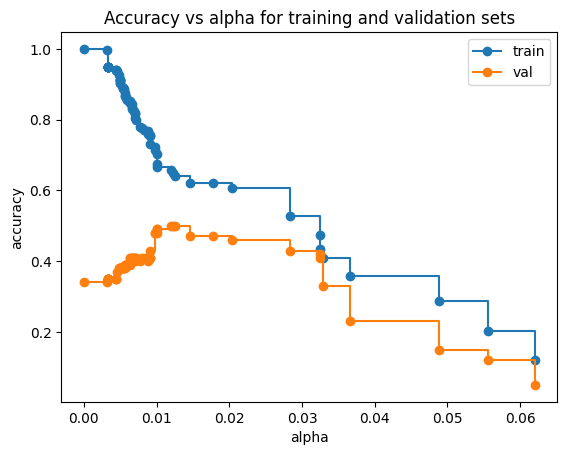

Best alpha: 0.01197368421052633
Training accuracy: 0.6566666666666666
Validation accuracy: 0.5


In [17]:
path = decision_tree.cost_complexity_pruning_path(song_dataset_X_train_tree, song_dataset_y_train_tree)
ccp_alphas, impurities = path.ccp_alphas, path.impurities

clfs = []
for ccp_alpha in ccp_alphas:
    clf = DecisionTreeClassifier(random_state=42, ccp_alpha=ccp_alpha)
    clf.fit(song_dataset_X_train_tree, song_dataset_y_train_tree)
    clfs.append(clf)

train_scores = [clf.score(song_dataset_X_train_tree, song_dataset_y_train_tree) for clf in clfs]
val_scores = [clf.score(song_dataset_X_val_tree, song_dataset_y_val_tree) for clf in clfs]

fig, ax = plt.subplots()
ax.set_xlabel("alpha")
ax.set_ylabel("accuracy")
ax.set_title("Accuracy vs alpha for training and validation sets")
ax.plot(ccp_alphas, train_scores, marker='o', label="train", drawstyle="steps-post")
ax.plot(ccp_alphas, val_scores, marker='o', label="val", drawstyle="steps-post")
ax.legend()
plt.show()

best_alpha = ccp_alphas[np.argmax(val_scores)]
print("Best alpha:", best_alpha)

pruned_tree = DecisionTreeClassifier(random_state=42, ccp_alpha=best_alpha)
pruned_tree.fit(song_dataset_X_train_tree, song_dataset_y_train_tree)

print("Training accuracy:", pruned_tree.score(song_dataset_X_train_tree, song_dataset_y_train_tree))
print("Validation accuracy:", pruned_tree.score(song_dataset_X_val_tree, song_dataset_y_val_tree))

In [18]:
test_accuracy = best_model.score(song_dataset_X_test_tree, song_dataset_y_test_tree)
print("Test accuracy:", test_accuracy)

plt.figure(figsize=(60,20), dpi = 600)
plot_tree(best_model, filled=True, feature_names=song_dataset_X_dev_tree.columns, class_names=['0', '1', '2', '3', '4', '5', '6', '7', '8', '9'], max_depth=8)
plt.show()

Test accuracy: 0.5


Top 3 Most Important Features: ['speechiness', 'loudness', 'instrumentalness']


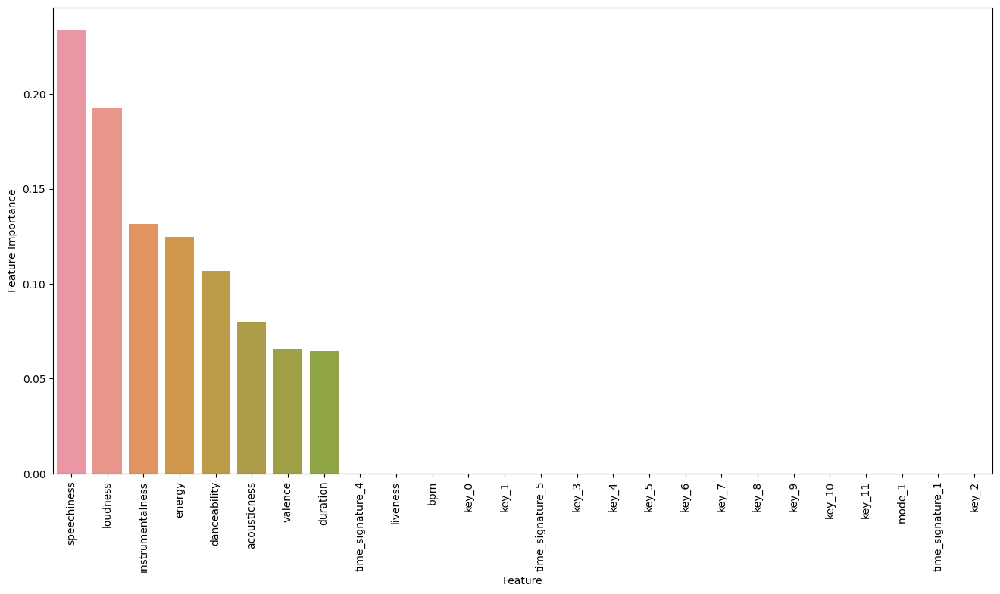

In [19]:
feat_importance = best_model.feature_importances_
top_3_indices = feat_importance.argsort()[::-1][:3]
top_3_features = list(song_dataset_X_dev_tree.columns[top_3_indices])
# top_3_importances = feat_importance[top_3_indices]
print(f'Top 3 Most Important Features: {top_3_features}')

importances = best_model.feature_importances_

sorted_indices = np.argsort(feat_importance)[::-1]
sorted_features = song_dataset_X_dev_tree.columns[sorted_indices]
sorted_importances = feat_importance[sorted_indices]
fig = plt.figure(figsize=(16, 8))
ax = sns.barplot(x=sorted_features, y=sorted_importances)
ax.tick_params(axis='x', rotation=90)
ax.set_ylabel('Feature Importance')
ax.set_xlabel('Feature')
plt.show()

### Random Forest Classifier

In [20]:
from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import RandomForestClassifier

song_dataset_X_dev_forest, song_dataset_X_test_forest, song_dataset_y_dev_forest, song_dataset_y_test_forest = train_test_split(song_dataset_transformed_new, genre_target_label, test_size=0.2, random_state=42)
song_dataset_X_train_forest, song_dataset_X_val_forest, song_dataset_y_train_forest, song_dataset_y_val_forest = train_test_split(song_dataset_X_dev_forest, song_dataset_y_dev_forest, test_size=0.25, random_state=42)

random_forest = RandomForestClassifier(random_state=42)
random_forest.fit(song_dataset_X_train_forest, song_dataset_y_train_forest)
print("Training accuracy: ", random_forest.score(song_dataset_X_train_forest, song_dataset_y_train_forest))
print("Validation accuracy: ", random_forest.score(song_dataset_X_val_forest, song_dataset_y_val_forest))
print("Test accuracy: ", random_forest.score(song_dataset_X_test_forest, song_dataset_y_test_forest))


Training accuracy:  1.0
Validation accuracy:  0.59
Test accuracy:  0.6


In [21]:
random_forest = RandomForestClassifier(random_state=42, oob_score=True)

param_grid = {
    'n_estimators': [50, 100, 200],
    'max_depth': [2, 4, 6, 8, 10],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4]
}
grid_search = GridSearchCV(random_forest, param_grid=param_grid, cv=5)
grid_search.fit(song_dataset_X_train_forest, song_dataset_y_train_forest)

print("OOB score:", grid_search.best_estimator_.oob_score_)
o_model = grid_search.best_estimator_
print('Best hyperparameters:', grid_search.best_params_)
print('Best cross-validation score:', grid_search.best_score_)
print("Training accuracy:", o_model.score(song_dataset_X_train_forest, song_dataset_y_train_forest))
print("Validation accuracy:", o_model.score(song_dataset_X_val_forest, song_dataset_y_val_forest))
print('Test accuracy:', o_model.score(song_dataset_X_test_forest, song_dataset_y_test_forest))

OOB score: 0.5966666666666667
Best hyperparameters: {'max_depth': 8, 'min_samples_leaf': 2, 'min_samples_split': 10, 'n_estimators': 100}
Best cross-validation score: 0.64
Training accuracy: 0.9266666666666666
Validation accuracy: 0.55
Test accuracy: 0.61


In [22]:
feat_importance = o_model.feature_importances_
top_3_indices = feat_importance.argsort()[::-1][:3]
top_3_features = list(song_dataset_X_dev_forest.columns[top_3_indices])
print(f'Top 3 Most Important Features: {top_3_features}')

Top 3 Most Important Features: ['speechiness', 'danceability', 'acousticness']


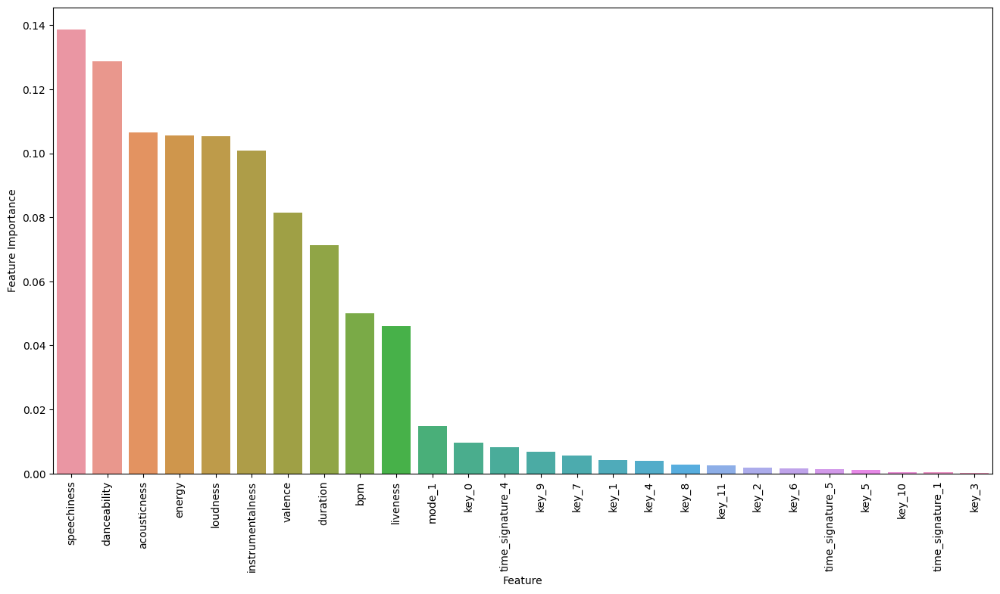

In [23]:
sorted_indices = np.argsort(feat_importance)[::-1]
sorted_features = song_dataset_X_dev_forest.columns[sorted_indices]
sorted_importances = feat_importance[sorted_indices]
fig = plt.figure(figsize=(16, 8))
ax = sns.barplot(x=sorted_features, y=sorted_importances)
ax.tick_params(axis='x', rotation=90)
ax.set_ylabel('Feature Importance')
ax.set_xlabel('Feature')
plt.show()

### Ensemble - XGBoost Classifier

In [24]:

song_dataset_X_dev_xgb, song_dataset_X_test_xgb, song_dataset_y_dev_xgb, song_dataset_y_test_xgb = train_test_split(song_dataset_transformed_new, genre_target_label, test_size=0.2, random_state=42)
song_dataset_X_train_xgb, song_dataset_X_val_xgb, song_dataset_y_train_xgb, song_dataset_y_val_xgb = train_test_split(song_dataset_X_dev_xgb, song_dataset_y_dev_xgb, test_size=0.25, random_state=42)


xgb = XGBClassifier(objective='multi:softmax', random_state=42)

param_grid = {
    'max_depth': [3, 4, 5],
    'learning_rate': [0.1, 0.01],
    'n_estimators': [50, 100, 200]
}

grid_search = GridSearchCV(xgb, param_grid=param_grid, cv=5)
grid_search.fit(song_dataset_X_train_xgb, song_dataset_y_train_xgb)

print('Best hyperparameters:', grid_search.best_params_)
print('Best cross-validation score:', grid_search.best_score_)

best_xgb = grid_search.best_estimator_
print('Validation accuracy:', best_xgb.score(song_dataset_X_val_xgb, song_dataset_y_val_xgb))
print('Test accuracy:', best_xgb.score(song_dataset_X_test_xgb, song_dataset_y_test_xgb))

Best hyperparameters: {'learning_rate': 0.1, 'max_depth': 4, 'n_estimators': 100}
Best cross-validation score: 0.58
Validation accuracy: 0.54
Test accuracy: 0.55


Top 3 Most Important Features: ['loudness', 'key_1', 'speechiness']


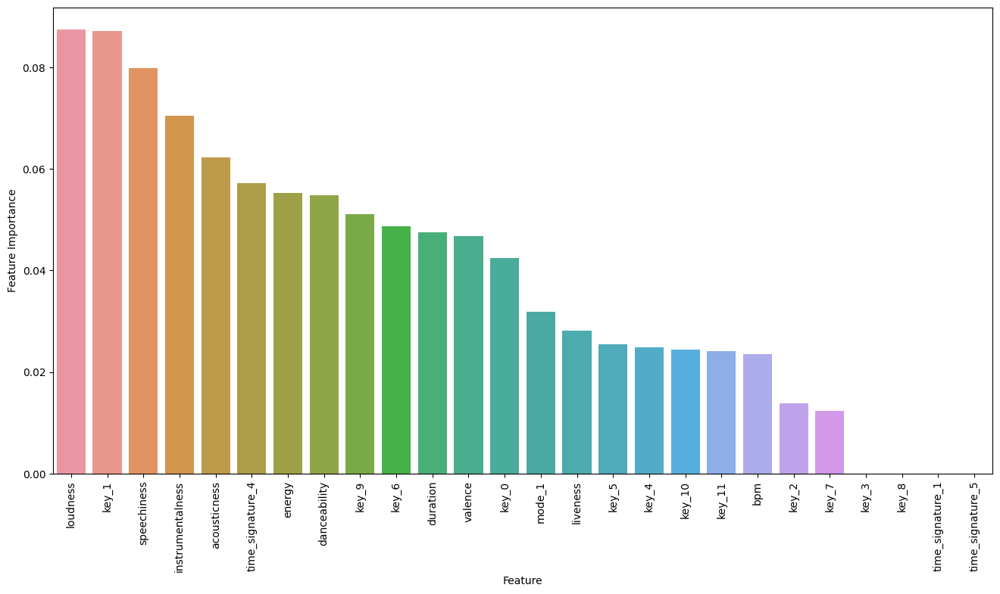

In [25]:
feat_importance = best_xgb.feature_importances_
top_3_indices = feat_importance.argsort()[::-1][:3]
top_3_features = list(song_dataset_X_dev_xgb.columns[top_3_indices])
print(f'Top 3 Most Important Features: {top_3_features}')

sorted_indices = np.argsort(feat_importance)[::-1]
sorted_features = song_dataset_X_dev_xgb.columns[sorted_indices]
sorted_importances = feat_importance[sorted_indices]
fig = plt.figure(figsize=(16, 8))
ax = sns.barplot(x=sorted_features, y=sorted_importances)
ax.tick_params(axis='x', rotation=90)
ax.set_ylabel('Feature Importance')
ax.set_xlabel('Feature')
plt.show()